**This is the parallelized NSGA-II code.**
**To run the code, click "Run All in Jupyter Notebook."**

**Importing Libraries**

In [1]:
import numpy as np
from numpy import sin,cos,pi,exp,sqrt
import time
import timeit
import math
import random
from numba import float64, int64, float32, int32, njit, prange, cuda
import matplotlib.pyplot as plt

**Creating functions for plotting the Pareto Fronts**

In [2]:

def plot2D(data,name,k):
    plt.figure(k)
    if k == 0:
        plt.title('{}\nInitial Population'.format(name))
    else:
        plt.title('{}\nGeneration {}'.format(name,k))
    plt.scatter(data[:,0],data[:,1])
    plt.grid()
    plt.xlabel('$f_{1}(x)$')
    plt.ylabel('$f_{2}(x)$')


def plot3D(data,name,k):

    plt.figure(k)
    ax = plt.axes(projection="3d")
    if k == 0:
        ax.set_title('{}\nInitial Population'.format(name))
    else:
        ax.set_title('{}\nGeneration {}'.format(name,k))
    ax.scatter(data[:,0],data[:,1],data[:,2])
    ax.grid()
    ax.set_xlabel('Mean Crystal Size')
    ax.set_ylabel('Speed of CSD')
    ax.set_zlabel('Total Time')

**Creating Population and individual classes and creating a function to calculate the fitness values**

In [3]:
###-------------------- DTLZ2 -------------------------###
nfunc,ncons,nvar,nchrom = 3,0,10,0
n = nchrom+nvar
func_name = 'DTLZ2({})'.format(n)

# The below function is the euler implementation of the Crystallization problem
@njit
def odefunc1(t, fi, Ti, delT1, delT2, delT3, tau, Rec, delx, x, fin, Tf, ep, rhoC, kv, kg, kb, kd, g, d, b):
    N = len(x)
    frec = fi[2 * N:3 * N]
    crec = fi[3 * N + 2]
    dfdt = np.zeros((N, 3))
    dfdt_combined = np.zeros(3 * N + 3)

    T = np.zeros(3)
    T[0] = Ti[0] - delT1 * (1 - np.exp(-t / 100))
    T[1] = Ti[1] - delT2 * (1 - np.exp(-t / 100))
    T[2] = Ti[2] - delT3 * (1 - np.exp(-t / 100))

    dcdt = np.zeros(3)
    for i in range(3):
        f = fi[(i * N):((i + 1) * N)]
        c = fi[3 * N + i]
        if i == 0:
            R = Rec[i]
            nf = (1 - R) * fin + R * frec
            cf = 7.09 * 10 ** -6 * Tf ** 2 - 1.93 * 10 ** -4 * Tf + 5.48 * 10 ** -3
            cf = (1 - R) * cf + R * crec
        else:
            R = Rec[i]
            nf = (1 - R) * fi[((i - 1) * N):(i * N)] + R * frec
            cf = fi[3 * N + i - 1]
            cf = (1 - R) * cf + R * crec

        csat = 7.09 * 10 ** -6 * T[i] ** 2 - 1.93 * 10 ** -4 * T[i] + 5.48 * 10 ** -3
        S = c / csat
        rels = S - 1
        V = (x ** 3 * f * kv * delx) * 10 ** -18
        Vtot = np.sum(V)
        if S >= 1:
            G = kg * (abs(rels)) ** g
            B = kb * Vtot * (abs(rels)) ** b
        else:
            G = -kd * (abs(rels)) ** d
            B = 0

        r = (np.diff(f[:-1]) + ep) / (np.diff(f[1:]) + ep)
        phi1 = (f[0] + ep) / (f[1] - f[0] + ep)
        phiend = (f[-1] - f[-2] + ep) / (-f[-1] + ep)
        phi = (np.abs(r) + r) / (1 + np.abs(r))

        Sel = 10 ** -6 * x ** 1.25
        Sel[0] = 0
        blambda = 2 / x
        Bbre = np.zeros(N)
        for j in range(N):
            Bbre[j] = np.sum(Sel[j:N] * blambda[j:N] * f[j:N] * delx)

        dcdt[i] = -3 * rhoC * kv * G * np.sum(f * x ** 2 * delx) - rhoC * kv * B * x[0] ** 3 * 10 ** -18 + (cf - c) / tau[i]
        dfdt[0, i] = -G / delx * f[0] - G / (2 * delx) * phi1 * (f[1] - f[0]) + B + (nf[0] - f[0]) / tau[i] + Bbre[0]
        dfdt[1, i] = -G / delx * (f[1] - f[0]) - G / (2 * delx) * ((f[2] - f[1]) * phi[1] - (f[1] - f[0]) * phi1) + (nf[1] - f[1]) / tau[i] - Sel[1] * f[1] + Bbre[1]
        dfdt[2:-1, i] = -G / delx * (np.diff(f[1:-1])) - G / (2 * delx) * (np.diff(f[2:]) * phi[1:] - np.diff(f[1:-1]) * phi[:-1]) + (nf[2:-1] - f[2:-1]) / tau[i] - Sel[2:-1] * f[2:-1] + Bbre[2:-1]
        dfdt[-1, i] = -G / delx * (f[-1] - f[-2]) - G / (2 * delx) * ((0 - f[-1]) * phiend - (f[-1] - f[-2]) * phi[-1]) + (nf[-1] - f[-1]) / tau[i] - Sel[-1] * f[-1]

    dfdt_combined[:N] = dfdt[:, 0]
    dfdt_combined[N:2 * N] = dfdt[:, 1]
    dfdt_combined[2 * N:3 * N] = dfdt[:, 2]
    dfdt_combined[3 * N:] = dcdt

    return dfdt_combined

@njit
def objfunc2_new(input):
    Ti = np.zeros(3)
    Ti[0] = input[0]
    delT1, delT2, delT3 = input[1:4]
    tau = input[4:7]
    Rec = input[7:10]

    Ti[1] = Ti[0] - delT1
    Ti[2] = Ti[1] - delT2

    N = 1000
    xmax = 1000  # um
    delx = xmax / N
    x = np.linspace(delx / 2, xmax, N)

    # Seed distribution
    sigma = 4
    mu = 15
    fin = 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

    # Initial concentration
    C0 = 7.09 * 10 ** -6 * Ti ** 2 - 1.93 * 10 ** -4 * Ti + 5.48 * 10 ** -3

    # Parameters
    g = 1
    kg = 0.337  # um/min
    kb = 1.39 * 10 ** 5  # #/m3min
    kd = 0.563  # um/min
    d = 1
    b = 2.62
    rhoC = 1.412e-15  # kg/um3
    kv = 0.32
    ep = 10 ** -10
    Tf = 40
    cfeed = 7.09 * 10 ** -6 * Tf ** 2 - 1.93 * 10 ** -4 * Tf + 5.48 * 10 ** -3
    T_avg = np.mean(Ti)
    csat_avg = 7.09 * 10 ** -6 * T_avg ** 2 - 1.93 * 10 ** -4 * T_avg + 5.48 * 10 ** -3

    Totaltime = np.sum(tau)
    tspan = np.arange(0, 101, 1)

    # Initial conditions
    n0 = np.zeros(3 * N + 3)
    n0[:N] = fin
    n0[N:2 * N] = fin
    n0[2 * N:3 * N] = fin
    n0[3 * N:] = C0

    # Solve ODEs using Euler's method
    numSteps = len(tspan)
    n = np.zeros((numSteps, 3 * N + 3))
    n[0, :] = n0
    dt = 1
    for step in range(numSteps - 1):
        fi = n[step, :]
        dfdt_combined = odefunc1(tspan[step], fi, Ti, delT1, delT2, delT3, tau, Rec, delx, x, fin, Tf, ep, rhoC, kv, kg, kb, kd, g, d, b)
        n[step + 1, :] = fi + dt * dfdt_combined

    obj1 = -(np.sum(x * n[-1, 2 * N:3 * N]) / np.sum(n[-1, 2 * N:3 * N]))
    obj2 = np.sqrt(np.sum(((x + obj1) ** 2) * n[-1, 2 * N:3 * N]) / np.sum(n[-1, 2 * N:3 * N]))
    obj3 = Totaltime

    output = np.zeros(3)
    output[0] = obj1
    output[1] = obj2
    output[2] = obj3

    return output

lim_r = np.vstack([(31,36),(1,4),(1,4),(1,4),(200,360),(200,360),(200,360),(0,0.3),(0,0.3),(0,0.3)])



"""
def f(x):
    M = 3
    k = M-1
    xm = x[k:]
    g = sum((xm-0.5)**2)
    f1 = (1+g)*cos(x[0]*pi/2)*cos(x[1]*pi/2)
    f2 = (1+g)*cos(x[0]*pi/2)*sin(x[1]*pi/2)
    f3 = (1+g)*sin(x[0]*pi/2)
    return np.array([f1,f2,f3]) #return array of function values(fitness values)
"""

# Input parameters for optimization

integers = False                 #True if DVs are integers
popsize,seed,ans = 200, 0.1, 1    #populationsize, seed for random, rigidness of limits (if 1, limits are rigid)
gener = 100                     #generations
optype = 1                      #crossover type

vlen = np.array([4,3,3])        #length of individual chromosomes
chrom = sum(vlen)               #total chromosome length

## Uncomment this if nchrom is not specified in the functions section
# nchrom = len(vlen)              #number of chromosomes

if nvar !=0:
    pmut_r = 1/nvar                 # real mutation probability, limits - [0,1/nvar]
else:
    pmut_r = 1

if nchrom !=0:
    pmut_b = 1/nchrom
else:
    pmut_b = 1                      # binary mutation probability, limits - [0,1/nchrom]

pcross = 1                      #crossover probability
di = 15                         #distribution index for crossover
dim = 20                        #distribution index for mutation
tol = 1e-6                      #tolerance level for checking constraint errors

## Class indiviual to create and store individuals as objects
class individual:
    def __init__(self):
        pass
        #define attributes below for individual
        self.genes = np.zeros(chrom)    #array of size chromosome length
        self.xreal = np.zeros(nvar)     #array of size no. of real variables
        self.xbin = np.zeros(nchrom)    #array of size no. of bin variables
        self.fitness = []               #objective values
        self.constr = []                #constraint values
        self.error = 0                  #constraint error
        self.S = []                     #dominating set
        self.n = 0                      #dominated number
        self.rank = 0                  #rank
        self.cub_len = 0                #crowd distance



## Class population to create and store populations as objects
class population:
    def __init__(self,popsize):             #input is the population size
        pass
        #define attributes for population
        self.maxrank = []               #highest rank of population
        self.rankrat = []               #rankratio
        self.rankno = np.zeros(popsize)     #Array with number of individuals for each rank
        # self.ind = []
        self.ind = [individual() for i in range(popsize)]   #List of indivuduals
        self.nondom = 0

**Init Function**

In [4]:
def init(pop):
    #Input:
        # pop - Population(object)

    """This is the module to Initialize the binary population"""
    random.seed(seed)       # seed
    for i in range(popsize):
        for j in range(chrom):
            # Generate a random variable between 0 and 1
            # If rand value>=0.5 assign 1, else assign 0
            a = random.random()
            if a>=0.5:
                pop.ind[i].genes[j] = 1 #update pop
            else:
                pop.ind[i].genes[j] = 0 #update pop
    return pop

pop1 = population(popsize)
pop1 = init(pop1)
genes_arr1 = np.zeros((popsize, chrom))
for i in range(popsize):
    genes_arr1[i] = pop1.ind[i].genes
print(genes_arr1)
%timeit init(pop1)

[[1. 0. 0. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 1. 0.]
 [1. 0. 1. ... 0. 0. 1.]
 ...
 [0. 0. 1. ... 0. 0. 1.]
 [0. 1. 1. ... 0. 1. 1.]
 [1. 0. 0. ... 1. 0. 0.]]
642 µs ± 577 ns per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


**Decode Function**

In [5]:
coef = (2**vlen) - 1    #array operations

def decode(pop):
    #Input:
        # pop - Population(object)

    """This module is to decode the chromosome to get real values"""
    # Algorithm used is based on K. Deb, Multiobjective Optimization Using Evolutionary Algorithms. Chichester, U.K.: Wiley, 2001.
    for i in range(popsize):
        # Initialize k and genlen
        # k (iterates over entire chrom) and genlen (to get separate xbins from chrom)
        k, genlen = 0, 0
        for j in range(nchrom):
            genlen = genlen + vlen[j]   # Length of chrom of variable i added to genlen
            total = 0
            while k<genlen:             # k runs until genlen to convert binary to real
                d = genlen - (k+1)
                c = 2**d
                total = total + c*pop.ind[i].genes[k]
                k = k+1
            if integers == True:
                pop.ind[i].xbin[j] = int(lim_b[j,0]+((lim_b[j,1]-lim_b[j,0])*(total/coef[j]))) # update pop with binary variable
            else:
                pop.ind[i].xbin[j] = lim_b[j,0]+((lim_b[j,1]-lim_b[j,0])*(total/coef[j])) # update pop with binary variable
    return pop

pop1 = population(popsize)
pop1 = init(pop1)
pop1 = decode(pop1)
xbin_arr = np.zeros((popsize, nchrom))
for i in range(popsize):
    for j in range(nchrom):
        xbin_arr[i][j] = pop1.ind[i].xbin[j]
print(xbin_arr)
%timeit decode(pop1)

[]
32.8 µs ± 114 ns per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


**Realinit function**

In [6]:
def realinit(pop):
    #Input:
        # pop - Population(object)

    """This is the function to initialize the real valued population"""
    random.seed(seed)               # Seed
    for i in range(popsize):
        for j in range(nvar):
            a = random.random()     # Generate rand variable

            #If bounds are specified, i.e rigid bounds, generate value between limits
            if ans==1:
                value = a*(lim_r[j,1]-lim_r[j,0])+lim_r[j,0]      #update pop

            #If bounds are not rigid, find random real values
            else:
                a1 = 2*a-1
                value = 1/a1          #update pop

            if integers == True:
                pop.ind[i].xreal[j] = int(value)
            else:
                pop.ind[i].xreal[j] = value

    return pop


**Ranking function**

In [7]:
@cuda.jit
def ranking1_kernel(ind_fitness, ind_error, dom_array, ind_S, ind_n): #This function compares each individual with every other individual.
    i, j = cuda.grid(2)
    if i < popsize and j < popsize:
        sum1, sum2, sum3, sum4 = 0, 0, 0, 0
        fit1 = ind_fitness[i]
        fit2 = ind_fitness[j]
        err1 = ind_error[i]
        err2 = ind_error[j]
        for k in range(ind_fitness.shape[1]):
            sum1 += fit1[k] <= fit2[k]
            sum2 += fit1[k] < fit2[k]
            sum3 += fit1[k] >= fit2[k]
            sum4 += fit1[k] > fit2[k]
        if ncons > 0:
            if (err1 < tol and err2 > tol) or (err2 > err1):
                dom_array[i][j] = 1
            elif (err1 > tol and err2 < tol) or (err1 > err2):
                dom_array[i][j] = 2
            else:
                if sum1 == ind_fitness.shape[1]:
                    if sum2 > 0:
                        dom_array[i][j] = 1
                elif sum3 == ind_fitness.shape[1]:
                    if sum4 > 0:
                        dom_array[i][j] = 2
                else:
                    dom_array[i][j] = 3
        else:
            if sum1 == ind_fitness.shape[1]:
                if sum2 > 0:
                    dom_array[i][j] = 1
            elif sum3 == ind_fitness.shape[1]:
                if sum4 > 0:
                    dom_array[i][j] = 2
            else:
                dom_array[i][j] = 3
        if i == j:
            dom_array[i][j] = 3

    cuda.syncthreads()

    # This block of code replaces -1 with the index of the other individuals in the Dominated Set of that particular individual after comparison.
    k, l = cuda.grid(2)
    if k < ind_fitness.shape[0] and l < ind_fitness.shape[0]:
        if dom_array[k][l] == 1:
            ind_S[k][l] = l
        if dom_array[k][l] == 2:
            cuda.atomic.add(ind_n, k, 1)

    cuda.syncthreads()

@cuda.jit
def ranking2_kernel(ind_n, ind_rank, temparr, rankarr, popsize): # This function creates the first Pareto Front of individuals.
    z = cuda.grid(1)
    if z < popsize:
        if ind_n[z] == 0:
            ind_rank[z] = 1
            temparr[z] = z + 1
        rankarr[0][z] = temparr[z]

def ranking3(ind_S, ind_rank, ind_n, temparr, rankarr, rankno, maxrank, popsize): # This function creates the rest of the Pareto Fronts of individuals.
    k = 1
    while temparr != [] and k<popsize:
        Q = []
        for i in temparr:
            for j in ind_S[i-1]:
                if j != -1:
                    ind_n[j] -= 1
                    if ind_n[j] == 0:
                        Q.append(j+1)
                        ind_rank[j] = k+1
        k = k+1
        temparr = Q
        rankarr[k-1,:len(temparr)] = temparr
        rankno[k-1] =len(temparr)
    maxrank = max(ind_rank)
    return ind_S, ind_rank, ind_n, temparr, rankarr, rankno, maxrank

def ranking_cuda(pop, popsize, ret_arr = False): # This function wraps ranking1_kernel, ranking2_kernel kernels and ranking3 function into one function to be used in the later functions.

    ind_fitness = np.zeros((popsize, nfunc)) # array of fitnesses of all the individuals
    ind_error = np.zeros(popsize)# array of errors of all the individuals
    ind_S = np.ones((popsize, popsize), dtype = int)*-1 # array of dominated sets of all the individuals (initialized with -1)
    ind_n = np.zeros(popsize, dtype = int) # array of n of all the individuals (initialized with -1)
    ind_rank = np.zeros(popsize, dtype = int) # array of donminated sets of all the individuals
    rankarr = np.zeros((popsize, popsize), dtype = int)
    for i in range(popsize):
        ind_fitness[i] = pop.ind[i].fitness
        ind_error[i] = pop.ind[i].error
        ind_n[i] = pop.ind[i].n
        ind_rank[i] = pop.ind[i].rank
    rankno = pop.rankno
    maxrank = pop.maxrank

    dom_array = np.zeros((popsize, popsize), dtype=int)
    temparr = np.ones(popsize, dtype=int) * -1
    Q = np.zeros(popsize, dtype=int)

    d_ind_fitness = cuda.to_device(ind_fitness)
    d_ind_error = cuda.to_device(ind_error)
    d_dom_array = cuda.to_device(dom_array)
    d_ind_S = cuda.to_device(ind_S)
    d_ind_n = cuda.to_device(ind_n)
    d_ind_rank = cuda.to_device(ind_rank)
    d_temparr = cuda.to_device(temparr)
    d_rankarr = cuda.to_device(rankarr)
    d_rankno = cuda.to_device(rankno)
    d_Q = cuda.to_device(Q)

    threads_per_block = (16, 16)
    blocks_per_grid_x = (popsize + threads_per_block[0] - 1) // threads_per_block[0]
    blocks_per_grid_y = (popsize + threads_per_block[1] - 1) // threads_per_block[1]
    blocks_per_grid = (blocks_per_grid_x, blocks_per_grid_y)

    ranking1_kernel[blocks_per_grid, threads_per_block](d_ind_fitness, d_ind_error, d_dom_array, d_ind_S, d_ind_n)
    cuda.synchronize()

    ranking2_kernel[blocks_per_grid_x, 16](d_ind_n, d_ind_rank, d_temparr, d_rankarr, popsize)
    cuda.synchronize()

    ind_S = d_ind_S.copy_to_host()
    ind_rank = d_ind_rank.copy_to_host()
    ind_n = d_ind_n.copy_to_host()
    temparr = d_temparr.copy_to_host()
    rankarr = d_rankarr.copy_to_host()

    temparr = [x for x in temparr if x != -1]
    rankarr[0, :len(temparr)] = temparr
    rankno[0] = len(temparr)

    ind_S, ind_rank, ind_n, temparr, rankarr, rankno, maxrank = ranking3(ind_S, ind_rank, ind_n, temparr, rankarr, rankno, maxrank, popsize)

    rankarr0_list = [x for x in rankarr[0] if x != -1]
    for i in range(popsize-len(rankarr0_list)):
        rankarr0_list.append(0)
    rankarr[0] = np.array(rankarr0_list)

    for i in range(popsize):
        pop.ind[i].S = ind_S[i]
        pop.ind[i].n = ind_n[i]
        pop.ind[i].rank = ind_rank[i]
    pop.rankno = rankno
    pop.maxrank = maxrank

    if ret_arr == True:
        return pop, rankarr, pop.rankno
    else:
        return pop, pop.rankno

**Func function**

In [8]:
@njit(parallel = True)
def evaluate_fitness_values(pop_xreal_xbin, pop_fitness):

    for i in prange(popsize):
        pop_fitness[i] = objfunc2_new(pop_xreal_xbin[i])

    return pop_fitness

def func_cuda(pop):
    pop.maxrank = 0         # Initialize highest Rank to 0

    pop_fitness = np.zeros((popsize, nfunc))
    pop_xreal_xbin = np.zeros((popsize, nvar + nchrom))
    for i in range(popsize):
        pop_xreal_xbin[i] = np.hstack([pop.ind[i].xreal, pop.ind[i].xbin])

    pop_fitness = evaluate_fitness_values(pop_xreal_xbin, pop_fitness)

    for i in range(popsize):
        pop.ind[i].fitness = pop_fitness[i]

        pop.ind[i].error = 0
        #Added if condition for constraints

        if ncons>0: #if there are constraints
            from ip import cstr                             # Import constraint function
            pop.ind[i].constr = cstr(xx)                    # Evaluate constraints


            # Check for negative constraint values
            violations = (pop.ind[i].constr < 0) # Returns Boolean array checking constraint violations

            # -sum of all negative values is taken as the error
            if np.any(violations):
                pop.ind[i].error = -sum(pop.ind[i].constr[violations]) #sum of all violations assigned to error

    # Update the rank attributes of population using rancon or ranking

    pop, rankarr, pop.rankno = ranking_cuda(pop, popsize, True)

    return pop



**Nselect function**

In [9]:
def nselect(curr_pop):
    #Input:
        # curr_pop - Population(object)

    """This is the module to get the different individuals selected"""
    """Tournament Selection"""
    random.seed(seed)                       # Seed
    k = 0                                   # Counter
    times_sel = np.zeros(popsize)           # Array for storing number of times an individual is selected

    # Create population to fill using selection
    sel_pop = population(popsize)

    for n in range(popsize):

        # Generate Random
        rnd1,rnd2 = random.random(),random.random()
        # Generate indices for selecting 2 candidates
        m1,m2 = math.floor((popsize-1)*rnd1),math.floor((popsize-1)*rnd2) #indices run from 0 to popsize-1

        """Indices start from zero, hence not required"""
        #if m1==0:
        #    m1 = (popsize-1) - k
        #if m2==0:
        #    m2 = (popsize-1) - n

        #Tournament selection Procedure
        #no change to algorithm here. Use of winner for simplicity

        rnk1,rnk2 = curr_pop.ind[m1].rank, curr_pop.ind[m2].rank            # Ranks of candidates
        len1,len2 = curr_pop.ind[m1].cub_len, curr_pop.ind[m2].cub_len      # Crowding distance of candidates

        #Lowest rank selected
        if rnk1>rnk2:
            winner = curr_pop.ind[m2]
        elif rnk2>rnk1:
            winner = curr_pop.ind[m1]
        #If ranks are equal, more crowd distance preferred
        elif len1>len2:
            winner = curr_pop.ind[m1]
        else:
            winner = curr_pop.ind[m2]

        # Assign winner to sel_pop
        sel_pop.ind[k] = winner
        times_sel[m1] = times_sel[m1]+1
        times_sel[m2] = times_sel[m2]+1

        k = k+1         # Counter Increment

    return sel_pop

**Mutate function**

In [10]:
def mutate(pop):
    #Input:
        # pop - Population(object)

    """This is the module used to formulate the mutation routine (binary)"""
    random.seed(seed)           # Seed
    for j in range(popsize):
        nmut = 0
        for i in range(chrom):
            # Generate random number
            # If rand < mutation probability, mutate gene
            a = random.random()
            if a <= pmut_b:
                nmut = nmut+1
                pop.ind[j].genes[i] = 1 - pop.ind[j].genes[i]    #mutate
    return pop
chrom = 3
np.random.seed(61)
pop1 = population(popsize)
for i in range(popsize):
    pop1.ind[i].genes = np.random.random_sample(chrom)
pop1 = mutate(pop1)
ind_genes1 = np.zeros((popsize, chrom))
for i in range(popsize):
    ind_genes1[i] = pop1.ind[i].genes
print(ind_genes1)
%timeit mutate(pop1)

[[0.17553052 0.81865027 0.12267323]
 [0.50044869 0.03507357 0.99645445]
 [0.07635565 0.37055609 0.69570245]
 [0.65907492 0.85926482 0.51299822]
 [0.11895328 0.54700496 0.52500182]
 [0.11765947 0.33253625 0.91817124]
 [0.97217657 0.27996654 0.288178  ]
 [0.96012683 0.53399135 0.63260509]
 [0.40077702 0.27531333 0.80801266]
 [0.47178108 0.7085569  0.86050881]
 [0.04401856 0.3949559  0.08971782]
 [0.54216837 0.95651715 0.87343746]
 [0.66543074 0.55214422 0.57402718]
 [0.45103431 0.2303086  0.07780073]
 [0.25030969 0.70765273 0.80692607]
 [0.73941684 0.27391641 0.54554752]
 [0.82889342 0.35755705 0.98965472]
 [0.23149548 0.74182973 0.73173284]
 [0.51531156 0.67324823 0.62708789]
 [0.90180739 0.96107013 0.81257307]
 [0.86153243 0.65938756 0.03165171]
 [0.87650163 0.33293188 0.42720129]
 [0.27145085 0.5554787  0.52173699]
 [0.75463816 0.87392913 0.16927549]
 [0.3407888  0.65725833 0.17802961]
 [0.20615313 0.52509006 0.56569357]
 [0.87968614 0.02137763 0.35398537]
 [0.79629367 0.33954819 0.08

**Crossover function**

In [11]:
def crossover(par_pop,ncross):
    #Input:
        # par_pop - Parent population(object)
        # ncross - number of crossovers(integer)

    """This module is for formulating the crossover process (non-uniform)"""
    random.seed(seed)               # Seed

    # Create the child population
    child_pop = population(popsize)

    #Initialize 2 counters to select 2 individuals at a time
    j,k = 0,0

    for i in range(int(popsize/2)):
        # Generate random
        rnd = random.random()
        # Check whether to do crossover
        if rnd<pcross:
            # Crossover to be done
            ncross = ncross + 1                         # Update number of crossovers
            mating_site = math.floor(rnd*(chrom+10))+1       # Select mating site

            # If mating site out of bounds, bring it between the bounds
            while mating_site>chrom-1:                  #chrom-1 because of indices
                mating_site = int(mating_site/2)

            # Assign genes to individuals in child population with swapping
            child_pop.ind[j].genes[:mating_site] = par_pop.ind[k+1].genes[:mating_site]         # j -> k+1
            child_pop.ind[j+1].genes[:mating_site] = par_pop.ind[k].genes[:mating_site]         # j+1 -> k

            # If mating site is less than chrom, assign the genes beyond mating site without swapping
            if mating_site<chrom:
                child_pop.ind[j].genes[mating_site:] = par_pop.ind[k].genes[mating_site:]       #j -> k
                child_pop.ind[j+1].genes[mating_site:] = par_pop.ind[k+1].genes[mating_site:]   #j+1 --> k+1

        else:
            # No crossover
            #Copy genes
            child_pop.ind[j].genes = par_pop.ind[k].genes
            child_pop.ind[j+1].genes = par_pop.ind[k+1].genes

        # Counter Increment
        j = j+2
        k = k+2

    return child_pop,ncross     # Returns updated population and number of crossovers done

**Unicross function**

In [12]:
def unicross(par_pop,ncross):
    #Input:
        # par_pop - Parent population(object)
        # ncross - number of crossovers(integer)
    """This module is for formulating the crossover process (uniform)"""

    random.seed(seed)               # Seed
    # Create the child population
    child_pop = population(popsize)

    #Initialize 2 counters to select 2 individuals at a time
    j,k = 0,0
    for i in range(int(popsize/2)):
        for n in range(chrom):
            rnd = random.random()
            # Check whether to do crossover
            if rnd<=pcross:
                # Crossover
                ncross = ncross+1       # Update number of crossovers
                # Exchange genes
                child_pop.ind[j].genes[n] = par_pop.ind[k+1].genes[n]
                child_pop.ind[j+1].genes[n] = par_pop.ind[k].genes[n]
            else:
                #No crossover
                # Copy genes
                child_pop.ind[j].genes[n] = par_pop.ind[k].genes[n]
                child_pop.ind[j+1].genes[n] = par_pop.ind[k+1].genes[n]

        # Counter Increment
        j = j+2
        k = k+2

    return child_pop, ncross        # Returns updated population and number of crossovers done

**Real_mutate function**

In [13]:
def real_mutate(pop,nmut):
    #Input:
        # pop - Population(object)
        # nmut - number of mutations(integer)

    """This is the module used to formulate the mutation routine (real valued)"""
    random.seed(seed)           #Seed
    for j in range(popsize):#loop over all individuals
        for i in range(nvar):#loop over all variables

            rnd = random.random()
            #check whether to do mutation or not
            if rnd<=pmut_r:
                y = pop.ind[j].xreal[i]
                yl,yu = lim_r[i,:]
                if y>yl:
                    #calculate delta, deltaq
                    if (y-yl)<(yu-y):
                        delta = (y-yl)/(yu-yl)
                    else:
                        delta = (yu-y)/(yu-yl)

                    indi = 1/(dim+1)
                    rnd = random.random()
                    xy = 1-delta
                    if rnd<=0.5:
                        val = 2*rnd + (1-2*rnd)*(xy**(dim+1))
                        deltaq = (val**indi) - 1
                    else:
                        val=2*(1-rnd)+2*(rnd-0.5)*(xy**(dim+1))
                        deltaq = 1 - (val**indi)
                    #change value for member
                    y = y+ deltaq*(yu-yl)
                    if y>yu:
                        y = yu
                    if y<yl:
                        y = yl
                    if integers == True:
                        pop.ind[j].xreal[i] = int(y) #update variable in individual j in population
                    else:
                        pop.ind[j].xreal[i] = y #update variable in individual j in population
                else: #this means y is yl
                    xy = random.random()

                    if integers == True:
                        pop.ind[j].xreal[i] = int(xy*(yu-yl) + yl) # update population
                    else:
                        pop.ind[j].xreal[i] = xy*(yu-yl) + yl # update population
                nmut = nmut+1 #update number of mutations

    return pop,nmut

**Realcross function**

In [14]:
def realcross(par_pop,ncross):
    #Input:
        # par_pop - Parent population(object)
        # ncross - number of crossovers(integer)

    """This is the function used for crossover for real coded GA"""
    random.seed(seed)                   #Seed

    # Create the child population
    child_pop = population(popsize)

    #Initialize 2 counters to select 2 individuals at a time
    y,n = 0,0
    for i in range(int(popsize/2)):
        # Generate Random
        rnd = random.random()
        if rnd<=pcross: # Checking crossover
            for j in range(nvar): #loop over all variables

                #select 2 parents
                par1 = par_pop.ind[y].xreal[j]
                par2 = par_pop.ind[y+1].xreal[j]

                # Limits
                yl,yu = lim_r[j,:]

                #Generate Random
                rnd = random.random()

                #check whether variable is selected or not
                if rnd<=0.5: #variable selected
                    ncross = ncross+1           #Update number if crossover

                    if abs(par1-par2)>tol:
                        if par2>par1:
                            y1,y2 = par1,par2
                        else:
                            y1,y2 = par2,par1

                        #find beta value
                        if (y1-yl)>(yu-y2):
                            beta=1+(2*(yu-y2)/(y2-y1))
                        else:
                            beta=1+(2*(y1-yl)/(y2-y1))

                        #find alpha value
                        expp = di+1
                        beta = 1/beta
                        alpha = 2-beta**expp

                        if alpha<0:
                            print("ERROR",alpha,y,n,par1,par2)
                            exit(0)

                        rnd = random.random()
                        if rnd <= 1/alpha:
                            alpha = alpha*rnd
                            expp = 1/(di+1)
                            betaq = alpha**expp
                        else:
                            alpha = alpha*rnd
                            alpha = 1/(2-alpha)
                            expp = 1/(di+1)

                            if alpha<0:
                                print("ERROR")
                                exit(0)
                            betaq = alpha**expp

                        #Generating 2 children
                        chld1 = 0.5*((y1+y2)-betaq*(y2-y1))
                        chld2 = 0.5*((y1+y2)+betaq*(y2-y1))
                    else: #abs(par1-par2)>tolerance
                        betaq = 1
                        y1,y2 = par1,par2

                        #Generating 2 children
                        chld1 = 0.5*((y1+y2)-betaq*(y2-y1))
                        chld2 = 0.5*((y1+y2)+betaq*(y2-y1))

                    if chld1<yl:
                        chld1 = y1
                    if chld2<yl:
                        chld2 = y1
                    if chld1>yu:
                        chld1 = y1
                    if chld2>yu:
                        chld1 = y1

                else: #variable not selected
                    #copy parents to children
                    chld1,chld2 = par1,par2

                if integers == True:
                    child_pop.ind[n].xreal[j] = int(chld1)
                    child_pop.ind[n+1].xreal[j] = int(chld2)
                else:
                    child_pop.ind[n].xreal[j] = chld1
                    child_pop.ind[n+1].xreal[j] = chld2

        else: #no crossover
            for j in range(nvar):
                #print(j)
                #copy parents to children
                child_pop.ind[n].xreal[j] = par_pop.ind[y].xreal[j]
                child_pop.ind[n+1].xreal[j] = par_pop.ind[y+1].xreal[j]

        # Counter Increment
        n = n+2
        y = y+2

    return child_pop,ncross

**Keepalive function**

In [15]:
popsize2 = 2*popsize                # Population size for global mating pool


# Function to sort arrays
def sort(arr):
    #Input:
        # arr - array to sort
        # m1 - length of array (integer)
    m1 = arr.shape[1]
    """Sort arrays"""
    for i in range(m1-1):
        for j in range(i+1,m1):
            if arr[1,i]>arr[1,j]:
                # Swap elements
                arr[0,i],arr[0,j] = arr[0,j],arr[0,i]
                arr[1,i],arr[1,j] = arr[1,j],arr[1,i]
    return arr

def gshare(globalpop,rnk,rankarr):
    #Input:
        # globalpop - Parent population(object)
        # rnk - Rank level(integer)
        # rankarr - Rank array

    """Assign Crowding Distances"""

    # Initialize length array
    # Length[0] will have sorted indices and length[1] will have crowding distances
    length = np.zeros((popsize2,2))

    #Number of individuals in rank level
    m1 = int(globalpop.rankno[rnk]) #indices from 0 but counter i(0 to maxrank) is input

    # If there is only one candidate in a rank. No need to sort
    if m1 == 1:
        # Select individual from rankarr
        a = int(rankarr[rnk,:m1])

        # Assign edge values.(Any value will work. Only 1 candidate)
        globalpop.ind[a-1].cub_len = 100*sum(abs((globalpop.ind[a-1].fitness)))

    else:
        fpara1 = np.zeros((2,m1))           # Create array for sorting

        # Select individuals from rnk row in rankarr and assign to fpara
        fpara1[0] = rankarr[rnk,:m1]

        for j in range(nfunc):
            # Assign fitness values of individuals to fpara
            fpara1[1] = [globalpop.ind[int(i-1)].fitness[j] for i in fpara1[0]] #i-1 since indices from 0

            # Sort fpara
            sortarray = sort(fpara1)

            maxval = sortarray[1,m1-1]          # Maximum value
            minval = sortarray[1,0]             # Minimum value

            # Diff added
            # Diff to Normalize crowding distance for each objective
            diff = maxval-minval

            ## Uncomment to eliminate normalization
            # diff = 1

            #If diff = 0, all individuals have same fitness values. No point in sorting
            if diff == 0:

                # print('diff = 0')
                if sum(sortarray[1] == maxval) == len(sortarray[1]): #Boolean array to check
                    # Assign edge values for all elements
                    for i in range(m1):
                        # Store values in length
                        length[i,0] = sortarray[0,i]
                        length[i,1] = 100*abs(maxval)

            # elif diff<0:
            #     print('error in diff/keepalive')

            else:
                # Normal crowding distances
                for i in range(m1):
                    length[i,0] = sortarray[0,i]        #assign indices
                    if i==0 or i==m1-1:                 #edge values
                        length[i,1] = 100*abs(maxval)
                    else:
                        #Normalized crowding distances
                        length[i,1] = abs((sortarray[1,i+1]-sortarray[1,i-1])/diff)

            for i in range(m1):
                a = int(length[i,0])                    #Select individuals
                # Add crowd distance of current objective to each individual
                globalpop.ind[a-1].cub_len = globalpop.ind[a-1].cub_len + length[i,1]


            """Consider the following loop to replace use of length array"""
            # for i in range(m1):
            #     a = int(sortarray[0,i])
            #     if i==0 or i==m1-1:
            #         globalpop.ind[a-1].cub_len = 100*abs(maxval)
            #     else:
            #         globalpop.ind[a-1].cub_len = globalpop.ind[a-1].cub_len + abs(sortarray[1,i+1]-sortarray[1,i-1])

    return globalpop

def gsort(globalpop,rankarr,rnk,sel,elite):
    #Input:
        # globalpop - Parent population(object)
        # rankarr - Rank array
        # rnk - Rank level(integer)
        # sel - number of individuals to be selected
        # elite - non-empty individual list to append sorted individuals (list)

    q = int(globalpop.rankno[rnk])                  # Number of individuals in current rank level
    array = np.zeros((2,q))                         # Create array to store individuals and crowding distances

    # # Select individual from rankarr and assign values in array
    array[0] = rankarr[rnk,:q]
    array[1] = [globalpop.ind[int(i-1)].cub_len for i in array[0]] #Changes to code: list comprehension

    #Sort array
    sortedarray = sort(array)

    # Select the best candidates after sorting and append to elite
    for i in sortedarray[0,-sel:][::-1]:    #Reverse the array
            elite.append(globalpop.ind[int(i-1)])

    return elite            # Returns complete list of individuals

def keepalive(pop1,pop2):
    #Input:
        # pop1 - Parent population(object)
        # pop2 - Child population(object)

    """Elitism and Diversity"""
    """This module takes the best candidates out of parents and offsprings"""

    # Create population to be filled with best candidates
    pop3 = population(popsize)

    #Create global mating pool
    globalpop = population(popsize2)
    # globalpop.ind = []

    # Fill individuals of parent and child population to global mating pool
    globalpop.ind = np.concatenate([pop1.ind,pop2.ind])

    # Rank global population and return rank array

    globalpop,rankarr,rankno = ranking_cuda(globalpop,popsize2,ret_arr=True)

    m = globalpop.maxrank                               # Highest Rank

    # Initialize all crowding distances to 0
    for i in range(popsize2):
        globalpop.ind[i].cub_len = 0

    # Assign crowding distances to all rank levels
    for i in range(m):                                  # Until highest rank
        globalpop = gshare(globalpop,i,rankarr)


    # poolf = popsize

    # Initialize pool. Pool will be the cumulative sum of individuals in each rank
    rec,pool = 0,0 #zero??? #Eliminate st to use only pool. Added in else:

    # Initialize elit. We will append the best individuals to elit
    elit = []

    for i in range(m):
        #Elitism
        pool = pool + globalpop.rankno[i]               # Add number of individuals in rank i to pool

        # If pool<=popsize, all candidates in that rank are added to pop3
        if pool<=popsize:
            for k in range(popsize2):
                if globalpop.ind[k].rank == i+1:        # indices from 0
                    # Add individuals to elit
                    elit.append(globalpop.ind[k])
            pop3.rankno[i] = globalpop.rankno[i]        # Update rankno of pop3

            # If pool = popsize, New population selected can be completely filled with elit. Then break loop
            if pool == popsize:
                pop3.ind = elit
                break

        else:
            # Pool has exceeded popsize. Use crowdsort to get best candidates from pool
            pool = pool - globalpop.rankno[i]                   # Reverse the cumulative sum
            sel = int(popsize-pool)                             # Number of individuals required
            pop3.rankno[i] = sel                                # Assign rankno for final rank in pop3


            # Crowdsort and assign list of individuals  to pop3
            pop3.ind = gsort(globalpop,rankarr,i,sel,elit)


            break

    # Update highest rank of population
    pop3.maxrank = i+1

    return pop3

**NSGA-II main function**

/home/iith/anaconda3/lib/python3.11/site-packages/numba/cuda/dispatcher.py:538: NumbaPerformanceWarning: Grid size 13 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))



generation 1


/home/iith/anaconda3/lib/python3.11/site-packages/numba/cuda/dispatcher.py:538: NumbaPerformanceWarning: Grid size 25 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))



generation 2

generation 3

generation 4

generation 5

generation 6

generation 7

generation 8

generation 9

generation 10

generation 11

generation 12

generation 13

generation 14

generation 15

generation 16

generation 17

generation 18

generation 19

generation 20


/tmp/ipykernel_272706/1914287772.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(k)



generation 21

generation 22

generation 23

generation 24

generation 25

generation 26

generation 27

generation 28

generation 29

generation 30

generation 31

generation 32

generation 33

generation 34

generation 35

generation 36

generation 37

generation 38

generation 39

generation 40

generation 41

generation 42

generation 43

generation 44

generation 45

generation 46

generation 47

generation 48

generation 49

generation 50

generation 51

generation 52

generation 53

generation 54

generation 55

generation 56

generation 57

generation 58

generation 59

generation 60

generation 61

generation 62

generation 63

generation 64

generation 65

generation 66

generation 67

generation 68

generation 69

generation 70

generation 71

generation 72

generation 73

generation 74

generation 75

generation 76

generation 77

generation 78

generation 79

generation 80

generation 81

generation 82

generation 83

generation 84

generation 85

generation 86

generatio

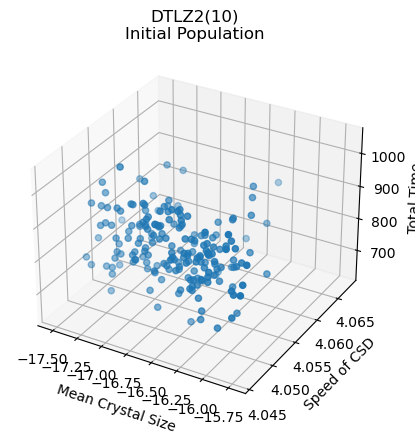

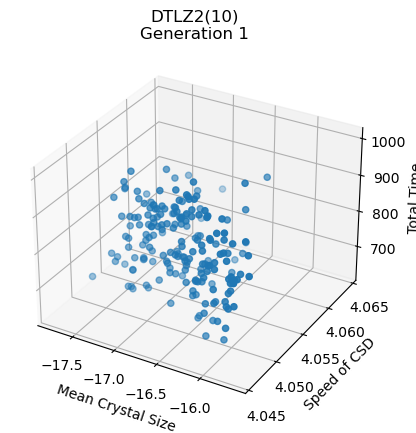

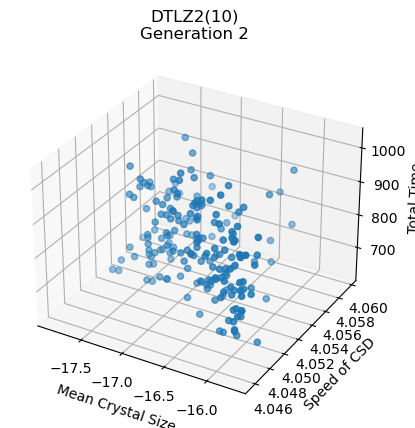

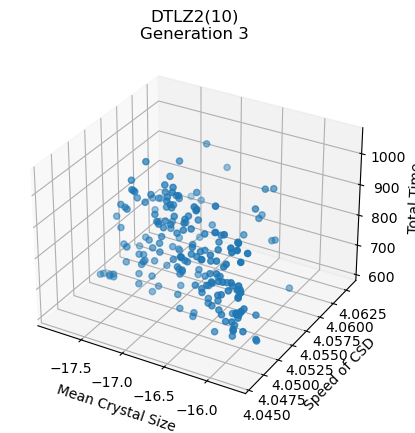

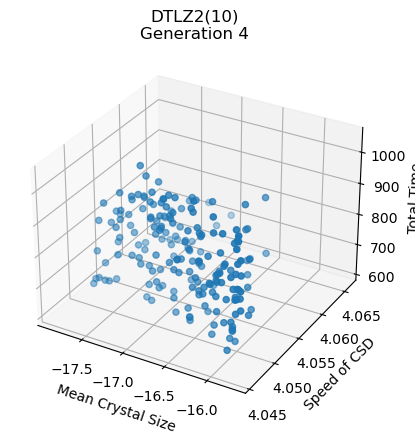

...

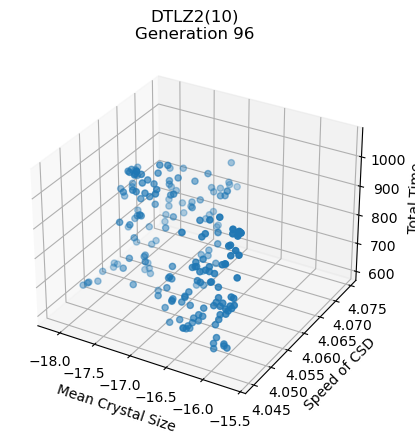

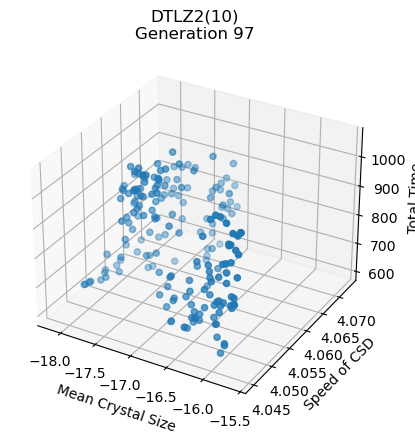

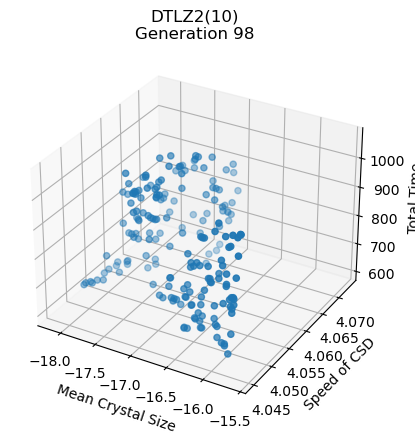

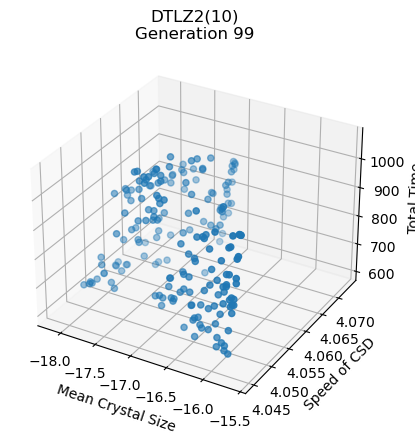

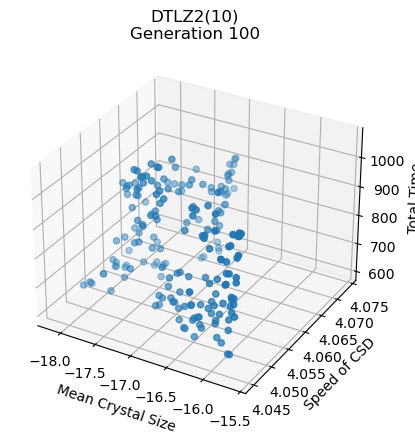

In [16]:
start = timeit.default_timer()
oldpoplist = []
#--------INITIATION-------#

nmut,ncross = 0,0                   #number of mutations and crossovers

# Create 2 population objects for old and new populations
oldpop,newpop = population(popsize),population(popsize)

# Fill the attributes of each individual using the initiation functions init and realinit
if nchrom>0:
   oldpop = init(oldpop)            #update population with binary population
   oldpop = decode(oldpop)          #decode binary variables for calculations
if nvar>0:
    oldpop = realinit(oldpop)       #update population with real population
    oldpoplist.append(oldpop)

#--------FUNCTION and CONSTRAINT EVALUATIONS-------#

oldpop = func_cuda(oldpop)               #function calculations
oldpoplist.append(oldpop)
# Term is an array of all fitness values of current population
# Initialize term with fitness value of 1st individual
term = oldpop.ind[0].fitness.T

for k in range(1,popsize):
    # vertically stacks up fitness values of other individuals as arrays
    term  = np.vstack([term,oldpop.ind[k].fitness.T])

# Graph is a list used to store the fitness values of all generations for animations
# Initialize graph
graph = []

# Add the current Term(fitness values). This is done in all generations
graph.append(term)

# Plot the initial population
plots = True                        #if plots are necessary

if plots==True:
    if nfunc==2:
        plot2D(term,func_name,0)    #Function for 2D plotting
    elif nfunc==3:
        plot3D(term,func_name,0)    #Function for 3D plotting




################################################################################
#------------------------ GENERATION STARTS HERE ------------------------------#

for i in range(gener):
    print('\ngeneration',i+1)

    #--------SELECTION-------#
    matepop = nselect(oldpop) #Tournament selection

    #--------CROSSOVER-------#
    # Create population with crossover and update number of crossovers

    # Binary crossover
    if nchrom>0:
        if optype==1:
            newpop,ncross = crossover(matepop,ncross)
        elif optype==2:
            newpop,ncross = unicross(matepop,ncross)

    # Real Crossover
    if nvar>0:
        newpop,ncross = realcross(matepop,ncross)


    #--------MUTATION--------#
    # Update population with mutation and update number of mutations
    if nchrom>0:
        newpop = mutate(newpop) #Binary
    if nvar>0:
        newpop,nmut = real_mutate(newpop,nmut) #Real mutation


    #--------DECODE---------#
    # Decode new binary population if any
    if nchrom>0:
        newpop = decode(newpop)

    #--------FUNCTION and CONSTRAINTS--------#
    # Evaluation on the new population
    newpop = func_cuda(newpop)


    #------ELITISM and DIVERSITY-----#
    #Elitism and diversity maintained using ranking and crowdingsort
    matepop = keepalive(oldpop,newpop)


    if nchrom>0:
        matepop = decode(matepop) #decode binary population if any

    #----------------RANK RATIO---------------#
    maxrank1 = max([oldpop.maxrank,matepop.maxrank]) #maximum rank among oldpop and matepop

    #Rankratio found using list comprehension
    matepop.rankrat = [(matepop.rankno[j]/(oldpop.rankno[j]+matepop.rankno[j])) for j in range(maxrank1)]


    #---------UPDATE OLD POPULATION-----------#
    oldpop = matepop
    oldpoplist.append(oldpop)


    # Update Term with new fitness values
    term = oldpop.ind[0].fitness.T
    for k in range(1,popsize):
        #stack up fitness terms to give current fitness values
        term  = np.vstack([term,oldpop.ind[k].fitness.T])

    #plot 2D or 3D graphs if needed
    if plots == True:
        if nfunc==2:
            plot2D(term,func_name,i+1)
        elif nfunc==3:
            plot3D(term,func_name,i+1)


    #Append current fitness data in list for animation
    graph.append(term)


#End timer
end = timeit.default_timer()

print('Time elapsed: {}'.format(end-start)) #elapsed time for computation